In [1]:
import os
import gzip
import glob2
import tarfile
import numpy as np
import matplotlib.pyplot as plt
from numpy import diff
from scipy.optimize import curve_fit
import csv
import math
from scipy.special import erfc
from scipy.special import erf
directory = os.getcwd()

In [2]:
# Functions
csvfilename = directory+'\\HPK25_1\\mpa_test_HPK25_1_Chip1_2021_02_08_08_57_42_PostTrim_CAL_CAL.csv'

def loadSCurvesFromCSV(csvfilename):
    #print(csvfilename)
    #scurvedict = dict()
    scurves = []
    #pixels = []
    start = 0
    stop = 256
    step = 1
    with open(csvfilename, 'r') as f:
        reader = csv.reader(f, delimiter=',')
        for row in reader:
            scurve = []
            if row[0] == '':
                start = int(row[1])
                stop = int(row[-1])
                step = int(row[2])-int(row[1])
                continue
            pixedid = int(row[0])
            for i in range(1,len(row)):
                scurve.append(int(row[i]))
            #scurve = row[1:]
            #pixels.append(pixedid)
            scurves.append(scurve)
            #scurvedict[pixedid] = scurve
    #return scurvedict,start,stop,step
    return scurves,start,stop,step

scurves, start, stop, step = loadSCurvesFromCSV(csvfilename)


In [16]:
def extract_scurve_differentiate(s_curve,s_type="CAL",n_pulse=1000,nominal_DAC=-1,start=0,stop=256):
    if nominal_DAC == -1:
        if s_type=="THR":
            nominal_DAC = 85
        elif s_type=="CAL":
            nominal_DAC = 15
    rms  = -1
    scurve = np.array(s_curve)
   # print(scurve,'h')
    ##scurve = np.delete(scurve, -1)#last entry always a 0
    #print(len(scurve))
    scurve = scurve[:256]
    print('scurve'+str(scurve))
    step = min(int((stop-start)/len(scurve)),1)
    #print(step)
    #step = 1
    DACvals = np.array(range(start,stop,step))
    if len(DACvals) != len(scurve):
        print("len(scurve) "+str(len(scurve))+", len(DACvals) "+str(len(DACvals)))
        return -1,-1,False
    print(DACvals)
    DACdiff = [x+.5 for x in DACvals]
    differentiated = np.diff(scurve)/np.diff(DACdiff)
    #differentiated = np.diff(scurve)/.5
    minmaxs = []
    if s_type == "THR":
        minmaxs = (np.diff(np.sign(np.diff(differentiated))) > 0).nonzero()[0] + 1 # local min
    elif s_type == "CAL":
        minmaxs = (np.diff(np.sign(np.diff(differentiated))) < 0).nonzero()[0] + 1 # local max

    scurvesvals = []
    for i in minmaxs: scurvesvals.append(scurve[i])
    meanpos = 0
   
    if len(scurvesvals)>0:
        meanpos = min(range(len(scurvesvals)), key=lambda i: abs(scurvesvals[i]-(n_pulse/2.)))
    else:
        print("No s curve found.")
        return -1,-1,False
    if (minmaxs[meanpos] <= (start +1)) or (minmaxs[meanpos] >= (stop -1)):#no good position to extract 
        return -1,-1,False
    if scurve[meanpos]<0 or scurve[meanpos]>n_pulse:
        return -1,-1,False
    
    # 5 Middle Points
    
    #findmeanx = [DACvals[minmaxs[meanpos]-5],DACvals[minmaxs[meanpos]-4],DACvals[minmaxs[meanpos]-3],DACvals[minmaxs[meanpos]-2],DACvals[minmaxs[meanpos]-1],DACvals[minmaxs[meanpos]],DACvals[minmaxs[meanpos]+1],DACvals[minmaxs[meanpos]+2],DACvals[minmaxs[meanpos]+3],DACvals[minmaxs[meanpos]+4],DACvals[minmaxs[meanpos]+5]]
    #findmeany = [scurve[minmaxs[meanpos]-5],scurve[minmaxs[meanpos]-4],scurve[minmaxs[meanpos]-3],scurve[minmaxs[meanpos]-2],scurve[minmaxs[meanpos]-1],scurve[minmaxs[meanpos]],scurve[minmaxs[meanpos]+1],scurve[minmaxs[meanpos]+2],scurve[minmaxs[meanpos]+3],scurve[minmaxs[meanpos]+4],scurve[minmaxs[meanpos]+5]]
    
    # 3 Middle Points
    
    findmeanx = [DACvals[minmaxs[meanpos]-1],DACvals[minmaxs[meanpos]],DACvals[minmaxs[meanpos]+1]]
    findmeany = [scurve[minmaxs[meanpos]-1],scurve[minmaxs[meanpos]],scurve[minmaxs[meanpos]+1]]
    
    # Fit middle points to a line
    linefit = np.polyfit(findmeanx,findmeany,1)
    
    
    if linefit[0] == 0:
        print("Fit failed.")
        return -1,-1,False
    truemean = ((n_pulse/2)-linefit[1])/linefit[0]
    print(linefit)
    print(findmeanx)
    print(findmeany)
    
    closestpos_truemean = min(range(len(DACvals)), key=lambda i: abs(DACvals[i]-truemean))
    sigma1 = False
    #sigma1val = 0.21
    sigma1val = 0.37
    idx1_a = closestpos_truemean
    idx1_b = closestpos_truemean
    true1sigmaplus  = -1
    true1sigmaminus = -1
    while (not sigma1) and (idx1_a>0) and idx1_a < (len(DACvals)-2):#2 sigma
        if abs(differentiated[idx1_a])<=sigma1val*abs(differentiated[closestpos_truemean]):
            sigma1 = True
            break
        idx1_a += 1
    sigma1 = False
    if (idx1_a>0) and (idx1_a<(len(DACvals)-1)) and (abs(abs(differentiated[idx1_a-1])-sigma1val*n_pulse)<abs(abs(differentiated[idx1_a])-sigma1val*n_pulse)): idx1_a -= 1
    while (not sigma1) and idx1_b > 0 and idx1_b < (len(DACvals)-2):#2 sigma
        if abs(differentiated[idx1_b])<=sigma1val*abs(differentiated[closestpos_truemean]):
            sigma1 = True
            break
        idx1_b -= 1
    if (idx1_b>0) and (idx1_b<(len(DACvals)-1)) and (abs(abs(differentiated[idx1_b+1])-sigma1val*n_pulse)<abs(abs(differentiated[idx1_b])-sigma1val*n_pulse)): idx1_b -= 1
   #####
    sigma2 = False
    #sigma2val = 0.01
    sigma2val = 0.018
    idx2_a  = idx1_a
    idx2_b  = idx1_b
    true2sigmaplus  = -1
    true2sigmaminus = -1
    while (not sigma2) and (idx2_a>0) and idx2_a < (len(DACvals)-2):#2 sigma
        if abs(differentiated[idx2_a])<=sigma2val*abs(differentiated[closestpos_truemean]):
            sigma2 = True
            break
        idx2_a += 1
    sigma2 = False
    if (idx2_a>0) and (idx2_a<(len(DACvals)-1)) and (abs(abs(differentiated[idx2_a-1])-sigma2val*n_pulse)<abs(abs(differentiated[idx2_a])-sigma2val*n_pulse)): idx2_a -= 1
    while (not sigma2) and idx2_b > 0 and idx2_b < (len(DACvals)-2):#2 sigma
        if abs(differentiated[idx2_b])<=sigma2val*abs(differentiated[closestpos_truemean]):
            sigma2 = True
            break
        idx2_b -= 1
    if (idx2_b>0) and (idx2_b<(len(DACvals)-1)) and (abs(abs(differentiated[idx2_b+1])-sigma2val*n_pulse)<abs(abs(differentiated[idx2_b])-sigma2val*n_pulse)): idx2_b -= 1
  #####
    h = scurve[255] - scurve[0]
    #np.sqrt(np.mean(y**2))
#     rms = 0
#     for i in findmeanx:
#         rms += i**2
#     rms = np.sqrt(rms / len(findmeanx))
   
    derivativeA = np.ma.masked_equal(differentiated,0)
   
    return truemean,(DACvals[idx1_a]-DACvals[idx1_b])/2., h, rms, differentiated

In [4]:
csvList = glob2.glob(directory+'\\HPK25_1\\*PostTrim_CAL_CAL.csv')    

In [5]:
calList = [] 
for i in csvList:
    calList.append(loadSCurvesFromCSV(i))
curves = []
for i in calList:
    curves.append(i[0])

In [17]:
# Derivative Method
parameters = []
for i in curves[0]:
    l = []
    l.append(extract_scurve_differentiate(i))
    parameters.append(l)
    #truemean = ((n_pulse/2)-linefit[1])/linefit[0]
#(500+3000)/245

scurve[   0    0    0    0    0    0    0    0    0    0    4   15   74  196
  402  687  914  988  997  999 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000
 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000 1000


In [8]:
# Extract SCurve

def errorf(x, *p):
    a, mu, sigma = p
    return 0.5*a*(1.0+erf((x-mu)/sigma))

def extract_scurve(s_curve,s_type="CAL",n_pulse=1000,nominal_DAC=-1,start=0,stop=256):
    if nominal_DAC == -1:
        if s_type=="THR":
            nominal_DAC = 85
        elif s_type=="CAL":
            nominal_DAC = 15
    mean = -1
    rms  = -1
    scurve = np.array(s_curve)
    #scurve = scurve[0][:257]
    fitsuccess = True;
    #print (s_type,n_pulse,nominal_DAC,start,stop)
    try:
        if s_type == "THR":
            start_DAC = np.argmax(scurve)+10
            while start_DAC <  (stop-start):
                if math.fabs(scurve[start_DAC] - n_pulse) < math.sqrt(n_pulse):
                    break
                start_DAC += 1
            if start_DAC >= stop-start-1:
                start_DAC = min(np.argmax(scurve)+10,stop-start-5)    
                #print("Fit Range (",start_DAC," to ", (stop-start), ") with initial parameters ", [n_pulse, nominal_DAC, 2],"for pixel",pixel)
                #print("A",range(start_DAC, (stop-start)))
                #print("B",scurve)
            par, cov = curve_fit(errorfc, range(start_DAC, (stop-start)), scurve[start_DAC + 1 :(stop-start) + 1], p0= [n_pulse, (start_DAC+(stop-start))/2, 2])
            #print("Paramters from fit ",par)
            #print("Covariance ", cov)
            mean = par[1]
            rms  = par[2]
        elif s_type == "CAL":
            start_DAC = 0
            #print("Fit Range (",start_DAC," to ", (stop-start), ") with initial parameters ", [n_pulse, nominal_DAC, 2])
            par, cov = curve_fit(errorf,  range(start_DAC, (stop-start)), scurve[start_DAC + 1 :(stop-start) + 1], p0= [n_pulse, nominal_DAC, 2])
            #print("Paramters from fit ",par)
            #print("Covariance ", cov)
            mean = par[1]
            rms  = par[2]
    except RuntimeError or TypeError:
        fitsuccess = False
        #print("Fit fails for input data")
        #print(s_curve)

    return mean,rms,fitsuccess, scurve[255] - scurve[0]


In [9]:
# Non-deriv, fit method!
param = []
for i in curves[0]:
    l = []
    l.append(extract_scurve(i))
    param.append(l)

C:\Users\nicol\anaconda3\envs\py27\lib\site-packages\scipy\optimize\minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [12]:
# Compare derivative

def sig(x,x0,a,k):
    y0 = a / (1 + np.exp(-k*(x-x0)))
    return y0

x = np.arange(0,257)
p0 = [10, 500, 1.9]
#print(len(yL))

differences = []
mean_diff = []
mean_deriv = []
mean_fit = []
mean_fit_funct = []
mean_deriv_funct = []

rms_fit_funct = []
rms_deriv_funct = []
itr = 0
for i in range(len(parameters)):
    print(itr)
    deriv = parameters[i][0][2] * .5 * (1 + erf((x-parameters[i][0][0])/parameters[i][0][1]))
    
    y = curves[0][i]
    popt, pcov = curve_fit(sig, x, y, p0, method='lm') 
    fit = sig(x, *popt)
    
    diff = np.abs(deriv - fit)
    differences.append(diff)
    mean_diff.append(np.mean(diff))
    mean_deriv.append(np.mean(deriv))
    mean_fit.append(np.mean(fit))
    
    mean_fit_funct.append(param[i][0][0])
    mean_deriv_funct.append(parameters[i][0][0])
    rms_fit_funct.append(param[i][0][1])
    rms_deriv_funct.append(parameters[i][0][1])
    
    itr += 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108


C:\Users\nicol\anaconda3\envs\py27\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358


In [61]:
len(mean_deriv_funct)

1888

Text(0.5,0,'S-Curve Mean')

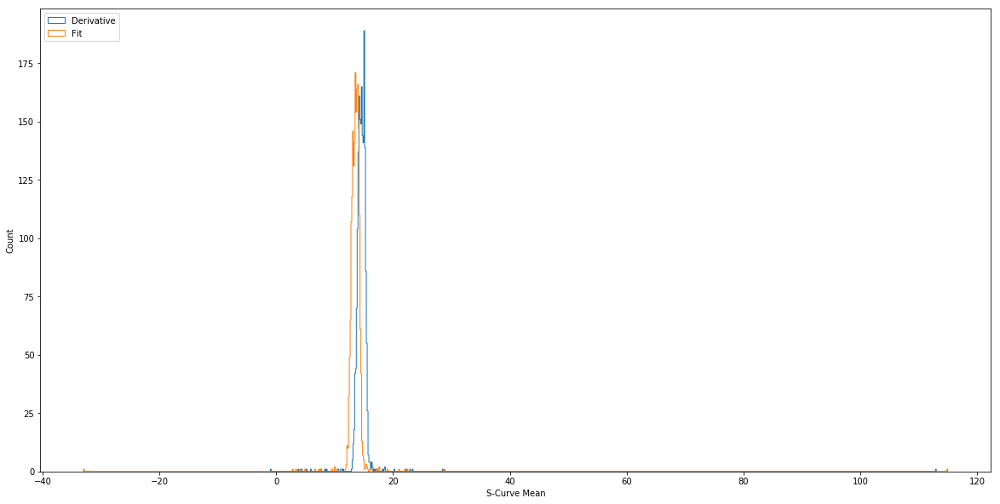

In [62]:
# Correct Plot
fig = plt.figure(figsize=(20,10))
plt.hist(mean_deriv_funct, bins = 'auto',label='Derivative',linestyle='solid',histtype='step',color='#1f77b4')
plt.hist(mean_fit_funct, bins = 'auto',label='Fit',linestyle='solid',histtype='step',color='#ff7f0e')
plt.legend()
plt.ylabel('Count')
plt.xlabel('S-Curve Mean')

Text(0.5,0,'S-Curve RMS')

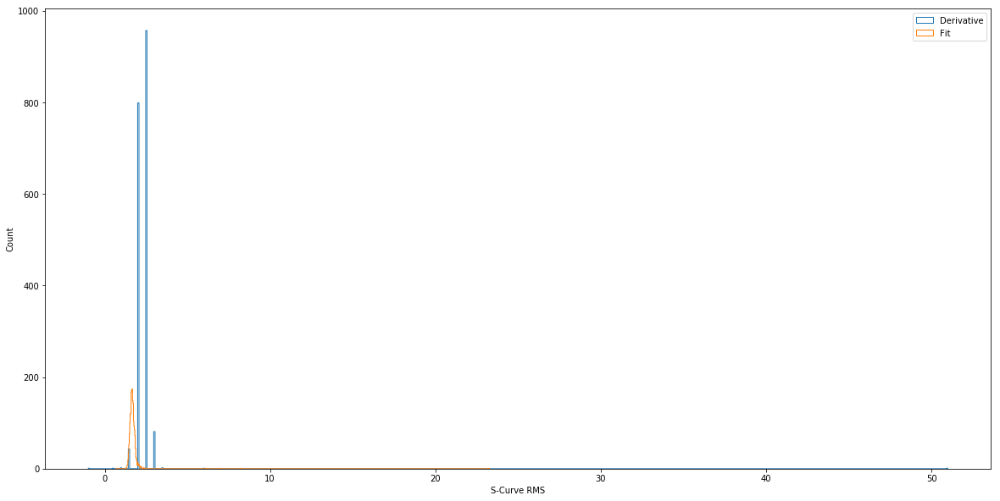

In [51]:
fig = plt.figure(figsize=(20,10))
plt.hist(rms_deriv_funct, bins = 'auto',label='Derivative',linestyle='solid',histtype='step')
plt.hist(rms_fit_funct, bins = 'auto',label='Fit',linestyle='solid',histtype='step')
plt.legend()
plt.ylabel('Count')
plt.xlabel('S-Curve RMS')

In [153]:
np.std(parameters[0][0][4])
np.std(x_d)

73.6115932898254

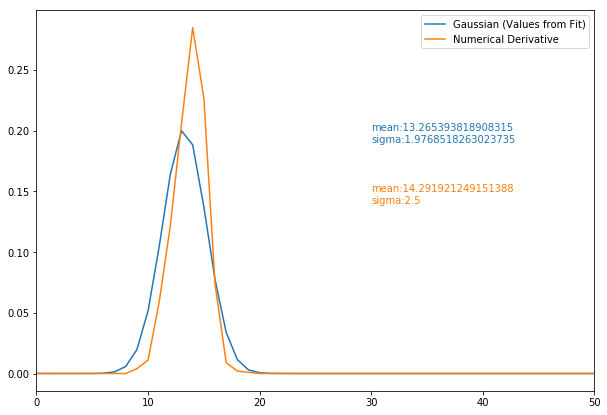

In [22]:
# Compare Gaussian from fit to Numerical Deriv, for a single pixel
fig = plt.figure(figsize=(10,7))
mu = param[0][0][0]
sigma = param[0][0][1]
x_f = np.arange(0,255,1)
gaussian = np.exp((-.5*(x_f-mu)**2)/sigma**2)

# Normalization
N = 1/np.trapz([parameters[0][0][4]],x=[x_d])
a = 1/np.trapz(gaussian)

x_d = np.arange(0,255)
#N = 1/np.sqrt(2*np.pi*(np.std(parameters[0][0][4]))**2)
plt.plot(x_f,a*gaussian,c='C0',label='Gaussian (Values from Fit)')
plt.plot(x_d,N*parameters[0][0][4],c='C1',label='Numerical Derivative')
plt.text(30, .200, 'mean:'+str(mu),color='C0')
plt.text(30, .190, 'sigma:'+str(sigma),color='C0')
plt.text(30, .150, 'mean:'+str(parameters[0][0][0]),color='C1')
plt.text(30, .140, 'sigma:'+str(parameters[0][0][1]),color='C1')
plt.xlim(0,50)
plt.legend()
plt.show()

Text(0.5,0,'Difference')

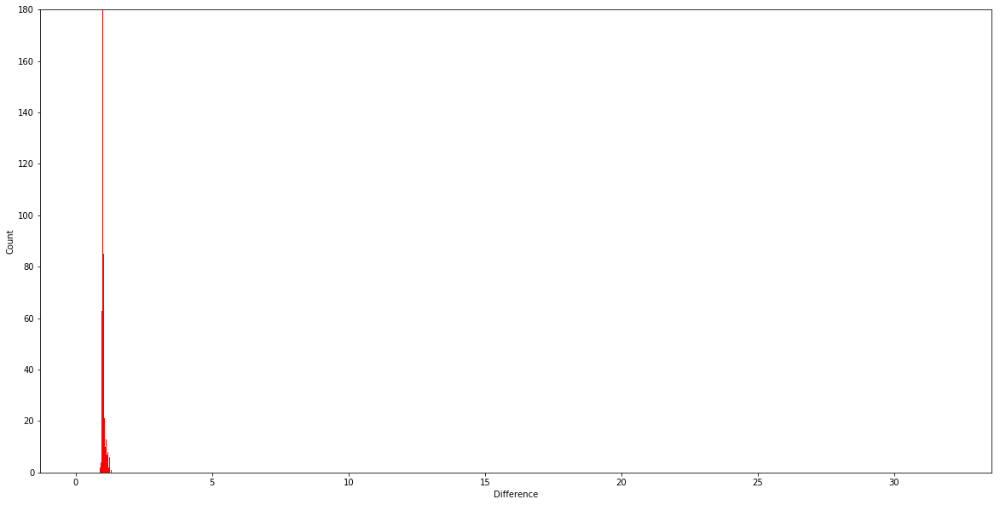

In [214]:
# Difference Histogram

diff_funct = []
zip_object = zip(mean_deriv_funct, mean_fit_funct)

for list1_i, list2_i in zip_object:
    diff_funct.append(np.abs(list1_i-list2_i))
    

#diff_funct = np.abs(mean_deriv_funct - mean_fit_funct)
fig = plt.figure(figsize=(20,10))
plt.hist(diff_funct, bins='auto')
plt.ylabel('Count')
plt.ylim(0,180)
plt.xlabel('Difference')

In [213]:
max(diff_funct)

31.986177953848234

In [187]:
np.argmin(mean_diff)

942

In [188]:
max(mean_diff)

101.2397915811156

In [ ]:
# 942, 941, 1000

In [190]:
for i in mean_diff:
    if i > 10:
        print(i)
        print(mean_diff.index(i))

99.03900643397873
941
72.44150045342461
943
18.369224611951978
1000
101.2397915811156
1049


In [194]:
for i in mean_diff:
    if i < 3.5:
        print(i)
        print(mean_diff.index(i))

0.9961089444889393
942
3.361860489840262
1302
